# IC3392 stellar and gas kinematic comparison across four runs

This notebook extends the 3-run IC3392 kinematic checks with a fourth run:

- `old_v721_7000`: original `v3_v7.2.1`, old CONFIG, fitting to 7000 A.
- `v768_7000`: `v3tk_v7.6.8_7000`, v7.6.8 code with old-style CONFIG, fitting to 7000 A.
- `v768_uptoSII`: same broad setup as `v768_full`, but GAS uses the shorter emission-line file up to SII 6730.
- `v768_full`: original `v3tk_v7.6.8`, wide/new CONFIG with the full red-line GAS file.

The primary test is `extra_red_lines_effect = v768_full - v768_uptoSII`. This isolates the effect of including the extra red/faint emission lines in the GAS fit while leaving the stellar kinematic setup unchanged.

The gas diagnostics focus on `HB4861`, `HA6562`, `NII6583`, and `SII6716` velocity and sigma. `NII6583` is used throughout, not the 6548-A component.


In [1]:
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits
from matplotlib.colors import TwoSlopeNorm

plt.style.use('seaborn-v0_8-whitegrid')
pd.set_option('display.max_columns', 120)
pd.set_option('display.max_colwidth', 160)

root = Path('.')
GALAXY = 'IC3392'

RUNS = {
    'old_v721_7000': {
        'label': 'v3_v7.2.1 old CONFIG to 7000',
        'plot_label': '7.2.1 old cfg 7000',
        'kin_path': root / 'v3_v7.2.1' / GALAXY / f'{GALAXY}_KIN_maps.fits',
        'gas_path': root / 'v3_v7.2.1' / GALAXY / f'{GALAXY}_gas_BIN_maps.fits',
        'config_path': root / 'v3_v7.2.1' / GALAXY / 'CONFIG',
    },
    'v768_7000': {
        'label': 'v3tk_v7.6.8_7000 old-style CONFIG to 7000',
        'plot_label': '7.6.8 old cfg 7000',
        'kin_path': root / 'v3tk_v7.6.8_7000' / GALAXY / f'{GALAXY}_kin_maps.fits',
        'gas_path': root / 'v3tk_v7.6.8_7000' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'config_path': root / 'v3tk_v7.6.8_7000' / GALAXY / 'CONFIG',
    },
    'v768_uptoSII': {
        'label': 'v3tk_v7.6.8 uptoSII GAS-line file',
        'plot_label': '7.6.8 uptoSII',
        'kin_path': root / 'v3tk_v7.6.8_uptoSII' / GALAXY / f'{GALAXY}_kin_maps.fits',
        'gas_path': root / 'v3tk_v7.6.8_uptoSII' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'config_path': root / 'v3tk_v7.6.8_uptoSII' / GALAXY / 'CONFIG',
    },
    'v768_full': {
        'label': 'v3tk_v7.6.8 full red-line GAS file',
        'plot_label': '7.6.8 full red lines',
        'kin_path': root / 'v3tk_v7.6.8' / GALAXY / f'{GALAXY}_kin_maps.fits',
        'gas_path': root / 'v3tk_v7.6.8' / GALAXY / f'{GALAXY}_gas_bin_maps.fits',
        'config_path': root / 'v3tk_v7.6.8' / GALAXY / 'CONFIG',
    },
}
RUN_ORDER = ['old_v721_7000', 'v768_7000', 'v768_uptoSII', 'v768_full']

PAIR_COMPARISONS = [
    {
        'pair_key': 'extra_red_lines_effect',
        'baseline': 'v768_uptoSII',
        'compare': 'v768_full',
        'label': 'full red-line GAS file minus uptoSII GAS file',
    },
    {
        'pair_key': 'uptoSII_vs_7000',
        'baseline': 'v768_7000',
        'compare': 'v768_uptoSII',
        'label': 'uptoSII full setup minus v7.6.8_7000 old-style setup',
    },
    {
        'pair_key': 'full_vs_7000',
        'baseline': 'v768_7000',
        'compare': 'v768_full',
        'label': 'full v7.6.8 setup minus v7.6.8_7000 old-style setup',
    },
    {
        'pair_key': 'version_proxy',
        'baseline': 'old_v721_7000',
        'compare': 'v768_7000',
        'label': 'v7.6.8_7000 minus v7.2.1; approximate nGIST-version effect',
    },
    {
        'pair_key': 'total_full_vs_old',
        'baseline': 'old_v721_7000',
        'compare': 'v768_full',
        'label': 'full v7.6.8 minus old v7.2.1',
    },
    {
        'pair_key': 'total_uptoSII_vs_old',
        'baseline': 'old_v721_7000',
        'compare': 'v768_uptoSII',
        'label': 'uptoSII v7.6.8 minus old v7.2.1',
    },
]
PAIR_BY_KEY = {pair['pair_key']: pair for pair in PAIR_COMPARISONS}
MAP_PAIR_KEYS = ['extra_red_lines_effect', 'uptoSII_vs_7000', 'full_vs_7000', 'version_proxy']

KIN_QUANTITIES = ['V', 'SIGMA', 'H3', 'H4']
GAS_LINES = ['HB4861', 'HA6562', 'NII6583', 'SII6716']
GAS_KIN_SUFFIXES = ['VEL', 'SIGMA']
GAS_KIN_EXTENSIONS = [f'{line}_{suffix}' for line in GAS_LINES for suffix in GAS_KIN_SUFFIXES]

TRACERS = {
    'KIN_V': {'file_key': 'kin_path', 'extname': 'V', 'kind': 'stellar', 'family': 'VEL', 'label': 'STELLAR KIN_V', 'cmap': 'RdBu_r', 'center_main': True, 'unit': 'km/s'},
    'KIN_SIGMA': {'file_key': 'kin_path', 'extname': 'SIGMA', 'kind': 'stellar', 'family': 'SIGMA', 'label': 'STELLAR KIN_SIGMA', 'cmap': 'magma', 'center_main': False, 'unit': 'km/s'},
    'KIN_H3': {'file_key': 'kin_path', 'extname': 'H3', 'kind': 'stellar', 'family': 'moment', 'label': 'STELLAR KIN_H3', 'cmap': 'RdBu_r', 'center_main': True, 'unit': None},
    'KIN_H4': {'file_key': 'kin_path', 'extname': 'H4', 'kind': 'stellar', 'family': 'moment', 'label': 'STELLAR KIN_H4', 'cmap': 'RdBu_r', 'center_main': True, 'unit': None},
    'GAS_HB4861_VEL': {'file_key': 'gas_path', 'extname': 'HB4861_VEL', 'kind': 'gas', 'family': 'VEL', 'line': 'HB4861', 'label': 'GAS HB4861_VEL', 'cmap': 'RdBu_r', 'center_main': True, 'unit': 'km/s'},
    'GAS_HB4861_SIGMA': {'file_key': 'gas_path', 'extname': 'HB4861_SIGMA', 'kind': 'gas', 'family': 'SIGMA', 'line': 'HB4861', 'label': 'GAS HB4861_SIGMA', 'cmap': 'magma', 'center_main': False, 'unit': 'km/s'},
    'GAS_HA6562_VEL': {'file_key': 'gas_path', 'extname': 'HA6562_VEL', 'kind': 'gas', 'family': 'VEL', 'line': 'HA6562', 'label': 'GAS HA6562_VEL', 'cmap': 'RdBu_r', 'center_main': True, 'unit': 'km/s'},
    'GAS_HA6562_SIGMA': {'file_key': 'gas_path', 'extname': 'HA6562_SIGMA', 'kind': 'gas', 'family': 'SIGMA', 'line': 'HA6562', 'label': 'GAS HA6562_SIGMA', 'cmap': 'magma', 'center_main': False, 'unit': 'km/s'},
    'GAS_NII6583_VEL': {'file_key': 'gas_path', 'extname': 'NII6583_VEL', 'kind': 'gas', 'family': 'VEL', 'line': 'NII6583', 'label': 'GAS NII6583_VEL', 'cmap': 'RdBu_r', 'center_main': True, 'unit': 'km/s'},
    'GAS_NII6583_SIGMA': {'file_key': 'gas_path', 'extname': 'NII6583_SIGMA', 'kind': 'gas', 'family': 'SIGMA', 'line': 'NII6583', 'label': 'GAS NII6583_SIGMA', 'cmap': 'magma', 'center_main': False, 'unit': 'km/s'},
    'GAS_SII6716_VEL': {'file_key': 'gas_path', 'extname': 'SII6716_VEL', 'kind': 'gas', 'family': 'VEL', 'line': 'SII6716', 'label': 'GAS SII6716_VEL', 'cmap': 'RdBu_r', 'center_main': True, 'unit': 'km/s'},
    'GAS_SII6716_SIGMA': {'file_key': 'gas_path', 'extname': 'SII6716_SIGMA', 'kind': 'gas', 'family': 'SIGMA', 'line': 'SII6716', 'label': 'GAS SII6716_SIGMA', 'cmap': 'magma', 'center_main': False, 'unit': 'km/s'},
}
FOCUS_TRACERS = ['KIN_V', 'KIN_SIGMA', 'GAS_HB4861_VEL', 'GAS_HB4861_SIGMA', 'GAS_HA6562_VEL', 'GAS_HA6562_SIGMA', 'GAS_NII6583_VEL', 'GAS_NII6583_SIGMA', 'GAS_SII6716_VEL', 'GAS_SII6716_SIGMA']
GAS_FOCUS_TRACERS = ['GAS_HB4861_VEL', 'GAS_HB4861_SIGMA', 'GAS_HA6562_VEL', 'GAS_HA6562_SIGMA', 'GAS_NII6583_VEL', 'GAS_NII6583_SIGMA', 'GAS_SII6716_VEL', 'GAS_SII6716_SIGMA']


def describe_path(path):
    if not path.exists():
        return {'exists': False, 'size_mb': np.nan, 'modified': ''}
    return {
        'exists': True,
        'size_mb': path.stat().st_size / 1024**2,
        'modified': datetime.fromtimestamp(path.stat().st_mtime).strftime('%Y-%m-%d %H:%M:%S'),
    }


file_rows = []
for run_key in RUN_ORDER:
    info = RUNS[run_key]
    for kind in ['kin_path', 'gas_path', 'config_path']:
        status = describe_path(info[kind])
        if not status['exists']:
            raise FileNotFoundError(f'Missing {run_key} {kind}: {info[kind]}')
    file_rows.append(
        {
            'run_key': run_key,
            'label': info['label'],
            'kin_path': str(info['kin_path']),
            'gas_path': str(info['gas_path']),
            'config_path': str(info['config_path']),
            'kin_modified': describe_path(info['kin_path'])['modified'],
            'gas_modified': describe_path(info['gas_path'])['modified'],
        }
    )

print('All required KIN, GAS, and CONFIG files found.')
display(pd.DataFrame(file_rows))


All required KIN, GAS, and CONFIG files found.


,run_key,label,kin_path,gas_path,config_path,kin_modified,gas_modified
0,old_v721_7000,v3_v7.2.1 old CONFIG to 7000,v3_v7.2.1/IC3392/IC3392_KIN_maps.fits,v3_v7.2.1/IC3392/IC3392_gas_BIN_maps.fits,v3_v7.2.1/IC3392/CONFIG,2026-03-15 13:55:42,2026-03-15 13:58:31
1,v768_7000,v3tk_v7.6.8_7000 old-style CONFIG to 7000,v3tk_v7.6.8_7000/IC3392/IC3392_kin_maps.fits,v3tk_v7.6.8_7000/IC3392/IC3392_gas_bin_maps.fits,v3tk_v7.6.8_7000/IC3392/CONFIG,2026-05-04 15:14:57,2026-05-04 15:20:20
2,v768_uptoSII,v3tk_v7.6.8 uptoSII GAS-line file,v3tk_v7.6.8_uptoSII/IC3392/IC3392_kin_maps.fits,v3tk_v7.6.8_uptoSII/IC3392/IC3392_gas_bin_maps.fits,v3tk_v7.6.8_uptoSII/IC3392/CONFIG,2026-05-04 20:07:59,2026-05-04 20:08:32
3,v768_full,v3tk_v7.6.8 full red-line GAS file,v3tk_v7.6.8/IC3392/IC3392_kin_maps.fits,v3tk_v7.6.8/IC3392/IC3392_gas_bin_maps.fits,v3tk_v7.6.8/IC3392/CONFIG,2026-03-21 13:47:53,2026-03-21 13:49:31


## CONFIG context

The first pair below is the targeted test. For `v768_uptoSII` versus `v768_full`, the useful difference should be only `GAS.EMI_FILE`, i.e. the shorter versus full emission-line configuration.

In [2]:
def parse_simple_config(path):
    config = {}
    section = None
    with open(path) as fh:
        for raw_line in fh:
            line = raw_line.rstrip()
            if not line or line.lstrip().startswith('#'):
                continue
            if not line.startswith(' ') and line.endswith(':'):
                section = line[:-1]
                config[section] = {}
                continue
            if section is not None and ':' in line:
                key, value = line.strip().split(':', 1)
                config[section][key.strip()] = value.strip()
    return config


CONFIG_FIELDS = [
    ('GENERAL', 'INPUT'),
    ('GENERAL', 'OUTPUT'),
    ('READ_DATA', 'ORIGIN'),
    ('READ_DATA', 'LMIN_TOT'),
    ('READ_DATA', 'LMAX_TOT'),
    ('READ_DATA', 'LMIN_SNR'),
    ('READ_DATA', 'LMAX_SNR'),
    ('SPATIAL_MASKING', 'MIN_SNR'),
    ('SPATIAL_MASKING', 'THRESHOLD_METHOD'),
    ('PREPARE_SPECTRA', 'VELSCALE'),
    ('KIN', 'SPEC_MASK'),
    ('KIN', 'LMIN'),
    ('KIN', 'LMAX'),
    ('KIN', 'SIGMA'),
    ('KIN', 'BIAS'),
    ('KIN', 'ADEG'),
    ('KIN', 'MDEG'),
    ('KIN', 'LIBRARY'),
    ('KIN', 'DUST_CORR'),
    ('CONT', 'LMAX'),
    ('CONT', 'MDEG'),
    ('CONT', 'LIBRARY'),
    ('CONT', 'DUST_CORR'),
    ('GAS', 'SPEC_MASK'),
    ('GAS', 'LEVEL'),
    ('GAS', 'LMIN'),
    ('GAS', 'LMAX'),
    ('GAS', 'MDEG'),
    ('GAS', 'EMI_FILE'),
    ('GAS', 'LIBRARY'),
    ('SFH', 'LMAX'),
    ('SFH', 'MDEG'),
    ('SFH', 'LIBRARY'),
    ('SFH', 'DUST_CORR'),
]

config_rows = []
for run_key in RUN_ORDER:
    config = parse_simple_config(RUNS[run_key]['config_path'])
    row = {'run_key': run_key, 'label': RUNS[run_key]['label']}
    for section, key in CONFIG_FIELDS:
        row[f'{section}.{key}'] = config.get(section, {}).get(key, '')
    config_rows.append(row)

config_summary = pd.DataFrame(config_rows)
display(config_summary)

pair_config_delta_rows = []
for pair in PAIR_COMPARISONS:
    base = config_summary.loc[config_summary['run_key'] == pair['baseline']].iloc[0]
    comp = config_summary.loc[config_summary['run_key'] == pair['compare']].iloc[0]
    for column in config_summary.columns:
        if column in {'run_key', 'label'}:
            continue
        if str(base[column]) != str(comp[column]):
            pair_config_delta_rows.append(
                {
                    'pair_key': pair['pair_key'],
                    'pair_label': pair['label'],
                    'field': column,
                    'baseline': base[column],
                    'compare': comp[column],
                }
            )

config_deltas = pd.DataFrame(pair_config_delta_rows)
focused_config_deltas = config_deltas[config_deltas['pair_key'] == 'extra_red_lines_effect']
print('Focused CONFIG delta: v768_full - v768_uptoSII')
display(focused_config_deltas)
print('All selected CONFIG deltas')
display(config_deltas)


,run_key,label,GENERAL.INPUT,GENERAL.OUTPUT,READ_DATA.ORIGIN,READ_DATA.LMIN_TOT,READ_DATA.LMAX_TOT,READ_DATA.LMIN_SNR,READ_DATA.LMAX_SNR,SPATIAL_MASKING.MIN_SNR,SPATIAL_MASKING.THRESHOLD_METHOD,PREPARE_SPECTRA.VELSCALE,KIN.SPEC_MASK,KIN.LMIN,KIN.LMAX,KIN.SIGMA,KIN.BIAS,KIN.ADEG,KIN.MDEG,KIN.LIBRARY,KIN.DUST_CORR,CONT.LMAX,CONT.MDEG,CONT.LIBRARY,CONT.DUST_CORR,GAS.SPEC_MASK,GAS.LEVEL,GAS.LMIN,GAS.LMAX,GAS.MDEG,GAS.EMI_FILE,GAS.LIBRARY,SFH.LMAX,SFH.MDEG,SFH.LIBRARY,SFH.DUST_CORR
0,old_v721_7000,v3_v7.2.1 old CONFIG to 7000,/arc/projects/mauve/cubes/v3.0/IC3392_DATACUBE_FINAL_WCS_Pall_mad_red_v3.fits,/arc/projects/mauve/products/v0.6/./IC3392,"218,218",4800,7000,4800,7000,1.5,,53,specMask_KIN,4800,7000,66,Auto,12,0,MILES_EMLINES/,,7000,8,MILES_EMLINES/,,specMask_GAS,BIN,4800,7000,8,emissionLinesPHANGS.config,MILES_EMLINES/,7000,12,MILES_safe/,
1,v768_7000,v3tk_v7.6.8_7000 old-style CONFIG to 7000,/scratch/pawsey1308/mauve/cubes/v3tk/IC3392_DATACUBE_FINAL_WCS_Pall_mad_red_v3tk.fits,/scratch/pawsey1308/mauve/products/v3tk_v7.6.8_7000/IC3392,"218,218",4800,7000,4800,7000,1.5,isophote,53,specMask_KIN,4800,7000,66,Auto,12,0,MILES_EMLINES/,false,7000,8,MILES_EMLINES/,false,specMask_GAS,BIN,4800,7000,8,emissionLines_ppxf.config,MILES_EMLINES/,7000,12,MILES_safe/,false
2,v768_uptoSII,v3tk_v7.6.8 uptoSII GAS-line file,/scratch/pawsey1308/mauve/cubes/v3tk/IC3392_DATACUBE_FINAL_WCS_Pall_mad_red_v3tk.fits,/scratch/pawsey1308/mauve/products/v3tk_v7.6.8_uptoSII/IC3392,"219,219",4800,9100,4800,9100,-10,actual,41,specMask_KIN_narrow10,4800,9100,82,muse_snr_prefit,23,0,EMILES_baseFe_EMLINES/,true,9100,23,EMILES_baseFe_EMLINES/,true,specMask_GAS_narrow10,BOTH,4800,9100,23,emissionLines_ppxf.config,EMILES_baseFe_EMLINES/,9100,23,EMILES_baseFe_safe/,true
3,v768_full,v3tk_v7.6.8 full red-line GAS file,/scratch/pawsey1308/mauve/cubes/v3tk/IC3392_DATACUBE_FINAL_WCS_Pall_mad_red_v3tk.fits,/scratch/pawsey1308/mauve/products/v3tk_v7.6.8/IC3392,"219,219",4800,9100,4800,9100,-10,actual,41,specMask_KIN_narrow10,4800,9100,82,muse_snr_prefit,23,0,EMILES_baseFe_EMLINES/,true,9100,23,EMILES_baseFe_EMLINES/,true,specMask_GAS_narrow10,BOTH,4800,9100,23,emissionLines_ppxf_full.config,EMILES_baseFe_EMLINES/,9100,23,EMILES_baseFe_safe/,true


Focused CONFIG delta: v768_full - v768_uptoSII


,pair_key,pair_label,field,baseline,compare
0,extra_red_lines_effect,full red-line GAS file minus uptoSII GAS file,GENERAL.OUTPUT,/scratch/pawsey1308/mauve/products/v3tk_v7.6.8_uptoSII/IC3392,/scratch/pawsey1308/mauve/products/v3tk_v7.6.8/IC3392
1,extra_red_lines_effect,full red-line GAS file minus uptoSII GAS file,GAS.EMI_FILE,emissionLines_ppxf.config,emissionLines_ppxf_full.config


All selected CONFIG deltas


,pair_key,pair_label,field,baseline,compare
0,extra_red_lines_effect,full red-line GAS file minus uptoSII GAS file,GENERAL.OUTPUT,/scratch/pawsey1308/mauve/products/v3tk_v7.6.8_uptoSII/IC3392,/scratch/pawsey1308/mauve/products/v3tk_v7.6.8/IC3392
1,extra_red_lines_effect,full red-line GAS file minus uptoSII GAS file,GAS.EMI_FILE,emissionLines_ppxf.config,emissionLines_ppxf_full.config
2,uptoSII_vs_7000,uptoSII full setup minus v7.6.8_7000 old-style setup,GENERAL.OUTPUT,/scratch/pawsey1308/mauve/products/v3tk_v7.6.8_7000/IC3392,/scratch/pawsey1308/mauve/products/v3tk_v7.6.8_uptoSII/IC3392
3,uptoSII_vs_7000,uptoSII full setup minus v7.6.8_7000 old-style setup,READ_DATA.ORIGIN,"218,218","219,219"
4,uptoSII_vs_7000,uptoSII full setup minus v7.6.8_7000 old-style setup,READ_DATA.LMAX_TOT,7000,9100
...,...,...,...,...,...
117,total_uptoSII_vs_old,uptoSII v7.6.8 minus old v7.2.1,GAS.LIBRARY,MILES_EMLINES/,EMILES_baseFe_EMLINES/
118,total_uptoSII_vs_old,uptoSII v7.6.8 minus old v7.2.1,SFH.LMAX,7000,9100
119,total_uptoSII_vs_old,uptoSII v7.6.8 minus old v7.2.1,SFH.MDEG,12,23
120,total_uptoSII_vs_old,uptoSII v7.6.8 minus old v7.2.1,SFH.LIBRARY,MILES_safe/,EMILES_baseFe_safe/


## Load maps

This loads the common stellar KIN maps plus `HB4861`, `HA6562`, `NII6583`, and `SII6716` velocity/sigma maps for all four runs. The full GAS run has additional red-line HDUs, while the uptoSII run stops at SII 6730; only common Halpha/NII maps are compared here.

In [3]:
def read_map(path, extname):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        arr = np.array(hdul[extname].data, dtype=float)
    arr[~np.isfinite(arr)] = np.nan
    return arr


def check_extensions(path, extensions):
    with fits.open(path, memmap=False, ignore_missing_end=True) as hdul:
        available = {hdu.name for hdu in hdul}
    missing = [ext for ext in extensions if ext not in available]
    if missing:
        raise KeyError(f'{path} missing extensions: {missing}')


def align_map_set(map_by_run, label=None):
    shapes = {run_key: arr.shape for run_key, arr in map_by_run.items()}
    unique_shapes = set(shapes.values())
    if len(unique_shapes) == 1:
        return map_by_run

    ndim = {len(shape) for shape in unique_shapes}
    if len(ndim) != 1:
        raise ValueError(f'{label or "map"}: cannot align maps with dimensions {shapes}')

    common_shape = tuple(min(shape[axis] for shape in unique_shapes) for axis in range(next(iter(ndim))))
    slices = tuple(slice(0, n) for n in common_shape)
    print(f'Warning: {label or "map"} shape mismatch {shapes}; using common crop {common_shape}.')
    return {run_key: arr[slices] for run_key, arr in map_by_run.items()}


def finite_values(arrays):
    chunks = []
    for arr in arrays:
        vals = np.asarray(arr)[np.isfinite(arr)]
        if vals.size > 0:
            chunks.append(vals.ravel())
    if not chunks:
        return np.array([], dtype=float)
    return np.concatenate(chunks)


def robust_limits(arr, p=(2, 98)):
    vals = np.asarray(arr)[np.isfinite(arr)]
    if vals.size == 0:
        return 0.0, 1.0
    lo, hi = np.nanpercentile(vals, p)
    if not np.isfinite(lo) or not np.isfinite(hi) or lo == hi:
        lo, hi = np.nanmin(vals), np.nanmax(vals)
        if lo == hi:
            hi = lo + 1.0
    return float(lo), float(hi)


def robust_symmetric_limit(arr, percentile=98, fallback=1.0):
    vals = np.abs(np.asarray(arr)[np.isfinite(arr)])
    if vals.size == 0:
        return float(fallback)
    limit = np.nanpercentile(vals, percentile)
    if not np.isfinite(limit) or limit == 0:
        limit = np.nanmax(vals)
    if not np.isfinite(limit) or limit == 0:
        limit = fallback
    return float(limit)


for run_key in RUN_ORDER:
    check_extensions(RUNS[run_key]['kin_path'], KIN_QUANTITIES)
    check_extensions(RUNS[run_key]['gas_path'], GAS_KIN_EXTENSIONS)

maps = {}
for tracer_key, spec in TRACERS.items():
    maps[tracer_key] = align_map_set(
        {run_key: read_map(RUNS[run_key][spec['file_key']], spec['extname']) for run_key in RUN_ORDER},
        tracer_key,
    )

print('Loaded aligned maps:')
for tracer_key in FOCUS_TRACERS:
    shapes = {run_key: maps[tracer_key][run_key].shape for run_key in RUN_ORDER}
    print(f'  {tracer_key}: {shapes}')

hdu_count_rows = []
for run_key in RUN_ORDER:
    with fits.open(RUNS[run_key]['gas_path'], memmap=False, ignore_missing_end=True) as hdul:
        names = [hdu.name for hdu in hdul]
    hdu_count_rows.append(
        {
            'run_key': run_key,
            'gas_hdu_count': len(names),
            'has_NII6583': 'NII6583_VEL' in names,
            'has_SII6730': 'SII6730_VEL' in names,
            'has_ARIII7135': 'ARIII7135_VEL' in names,
            'has_SIII9068': 'SIII9068_VEL' in names,
        }
    )
display(pd.DataFrame(hdu_count_rows))


Loaded aligned maps:
  KIN_V: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_full': (438, 437)}
  KIN_SIGMA: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_full': (438, 437)}
  GAS_HB4861_VEL: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_full': (438, 437)}
  GAS_HB4861_SIGMA: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_full': (438, 437)}
  GAS_HA6562_VEL: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_full': (438, 437)}
  GAS_HA6562_SIGMA: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_full': (438, 437)}
  GAS_NII6583_VEL: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v768_full': (438, 437)}
  GAS_NII6583_SIGMA: {'old_v721_7000': (438, 437), 'v768_7000': (438, 437), 'v768_uptoSII': (438, 437), 'v

,run_key,gas_hdu_count,has_NII6583,has_SII6730,has_ARIII7135,has_SIII9068
0,old_v721_7000,105,True,True,False,False
1,v768_7000,105,True,True,False,False
2,v768_uptoSII,105,True,True,False,False
3,v768_full,154,True,True,True,True


## Pairwise summary statistics

Rows are ordered so the direct `v768_full - v768_uptoSII` test appears first. For gas kinematics, a large `extra_red_lines_effect` means the full red-line GAS file changes Halpha/NII even though the stellar KIN maps are unchanged.

In [4]:
def percent_change_map(baseline_map, compare_map):
    pct = np.full(baseline_map.shape, np.nan, dtype=float)
    mask = np.isfinite(baseline_map) & np.isfinite(compare_map) & (baseline_map != 0)
    pct[mask] = 100.0 * (compare_map[mask] - baseline_map[mask]) / np.abs(baseline_map[mask])
    return pct, mask


def compare_stats(baseline_map, compare_map, tracer_key, pair):
    mask = np.isfinite(baseline_map) & np.isfinite(compare_map)
    pct_map, pct_mask = percent_change_map(baseline_map, compare_map)
    spec = TRACERS[tracer_key]
    base = {
        'pair_key': pair['pair_key'],
        'pair_label': pair['label'],
        'baseline_run': pair['baseline'],
        'compare_run': pair['compare'],
        'tracer': tracer_key,
        'tracer_label': spec['label'],
        'kind': spec['kind'],
        'family': spec['family'],
    }
    if mask.sum() == 0:
        base.update({
            'n_valid': 0,
            'pearson_r': np.nan,
            'median_baseline': np.nan,
            'median_compare': np.nan,
            'median_delta_compare_vs_baseline': np.nan,
            'median_abs_delta': np.nan,
            'p16_delta': np.nan,
            'p84_delta': np.nan,
            'rms_delta': np.nan,
            'median_abs_pct_change': np.nan,
        })
        return base

    baseline_vals = baseline_map[mask]
    compare_vals = compare_map[mask]
    delta = compare_vals - baseline_vals
    if baseline_vals.size > 1 and np.nanstd(baseline_vals) > 0 and np.nanstd(compare_vals) > 0:
        pearson_r = float(np.corrcoef(baseline_vals, compare_vals)[0, 1])
    else:
        pearson_r = np.nan
    pct_vals = pct_map[pct_mask]
    base.update({
        'n_valid': int(mask.sum()),
        'pearson_r': pearson_r,
        'median_baseline': float(np.nanmedian(baseline_vals)),
        'median_compare': float(np.nanmedian(compare_vals)),
        'median_delta_compare_vs_baseline': float(np.nanmedian(delta)),
        'median_abs_delta': float(np.nanmedian(np.abs(delta))),
        'p16_delta': float(np.nanpercentile(delta, 16)),
        'p84_delta': float(np.nanpercentile(delta, 84)),
        'rms_delta': float(np.sqrt(np.nanmean(delta**2))),
        'median_abs_pct_change': float(np.nanmedian(np.abs(pct_vals))) if pct_vals.size else np.nan,
    })
    return base


summary_rows = []
for pair in PAIR_COMPARISONS:
    for tracer_key in TRACERS:
        summary_rows.append(compare_stats(maps[tracer_key][pair['baseline']], maps[tracer_key][pair['compare']], tracer_key, pair))

summary = pd.DataFrame(summary_rows)
summary = summary[
    [
        'pair_key', 'tracer', 'kind', 'family', 'baseline_run', 'compare_run', 'n_valid', 'pearson_r',
        'median_delta_compare_vs_baseline', 'median_abs_delta', 'p16_delta', 'p84_delta',
        'rms_delta', 'median_abs_pct_change', 'pair_label'
    ]
]

focused_extra_red_lines = summary[summary['pair_key'] == 'extra_red_lines_effect']
print('Focused pair: v768_full - v768_uptoSII')
display(focused_extra_red_lines)

print('Gas velocity/sigma comparison summary')
display(summary[summary['kind'] == 'gas'])

pivot = summary[summary['tracer'].isin(FOCUS_TRACERS)].pivot(
    index='tracer',
    columns='pair_key',
    values=['median_abs_delta', 'rms_delta', 'pearson_r'],
)
display(pivot)


Focused pair: v768_full - v768_uptoSII


,pair_key,tracer,kind,family,baseline_run,compare_run,n_valid,pearson_r,median_delta_compare_vs_baseline,median_abs_delta,p16_delta,p84_delta,rms_delta,median_abs_pct_change,pair_label
0,extra_red_lines_effect,KIN_V,stellar,VEL,v768_uptoSII,v768_full,94543,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,full red-line GAS file minus uptoSII GAS file
1,extra_red_lines_effect,KIN_SIGMA,stellar,SIGMA,v768_uptoSII,v768_full,94543,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,full red-line GAS file minus uptoSII GAS file
2,extra_red_lines_effect,KIN_H3,stellar,moment,v768_uptoSII,v768_full,94543,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,full red-line GAS file minus uptoSII GAS file
3,extra_red_lines_effect,KIN_H4,stellar,moment,v768_uptoSII,v768_full,94543,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,full red-line GAS file minus uptoSII GAS file
4,extra_red_lines_effect,GAS_HB4861_VEL,gas,VEL,v768_uptoSII,v768_full,94543,0.987222,0.002304,0.095167,-0.120501,1.531310,9.541494,0.238106,full red-line GAS file minus uptoSII GAS file
5,extra_red_lines_effect,GAS_HB4861_SIGMA,gas,SIGMA,v768_uptoSII,v768_full,94543,0.978101,-0.038934,0.388088,-1.608539,0.684313,9.999040,0.409519,full red-line GAS file minus uptoSII GAS file
6,extra_red_lines_effect,GAS_HA6562_VEL,gas,VEL,v768_uptoSII,v768_full,94543,0.987222,0.002304,0.095167,-0.120501,1.531310,9.541494,0.238106,full red-line GAS file minus uptoSII GAS file
7,extra_red_lines_effect,GAS_HA6562_SIGMA,gas,SIGMA,v768_uptoSII,v768_full,94543,0.979048,-0.047262,0.454636,-1.724280,0.751164,10.599982,0.517642,full red-line GAS file minus uptoSII GAS file
8,extra_red_lines_effect,GAS_NII6583_VEL,gas,VEL,v768_uptoSII,v768_full,94543,0.947763,-1.298147,1.559003,-17.795999,0.001975,15.502743,5.021670,full red-line GAS file minus uptoSII GAS file
9,extra_red_lines_effect,GAS_NII6583_SIGMA,gas,SIGMA,v768_uptoSII,v768_full,94543,0.551992,-0.525105,1.340583,-11.772361,0.251288,7.854154,2.192920,full red-line GAS file minus uptoSII GAS file


Gas velocity/sigma comparison summary


,pair_key,tracer,kind,family,baseline_run,compare_run,n_valid,pearson_r,median_delta_compare_vs_baseline,median_abs_delta,p16_delta,p84_delta,rms_delta,median_abs_pct_change,pair_label
4,extra_red_lines_effect,GAS_HB4861_VEL,gas,VEL,v768_uptoSII,v768_full,94543,0.987222,0.002304,0.095167,-0.120501,1.531310,9.541494,0.238106,full red-line GAS file minus uptoSII GAS file
5,extra_red_lines_effect,GAS_HB4861_SIGMA,gas,SIGMA,v768_uptoSII,v768_full,94543,0.978101,-0.038934,0.388088,-1.608539,0.684313,9.999040,0.409519,full red-line GAS file minus uptoSII GAS file
6,extra_red_lines_effect,GAS_HA6562_VEL,gas,VEL,v768_uptoSII,v768_full,94543,0.987222,0.002304,0.095167,-0.120501,1.531310,9.541494,0.238106,full red-line GAS file minus uptoSII GAS file
7,extra_red_lines_effect,GAS_HA6562_SIGMA,gas,SIGMA,v768_uptoSII,v768_full,94543,0.979048,-0.047262,0.454636,-1.724280,0.751164,10.599982,0.517642,full red-line GAS file minus uptoSII GAS file
8,extra_red_lines_effect,GAS_NII6583_VEL,gas,VEL,v768_uptoSII,v768_full,94543,0.947763,-1.298147,1.559003,-17.795999,0.001975,15.502743,5.021670,full red-line GAS file minus uptoSII GAS file
9,extra_red_lines_effect,GAS_NII6583_SIGMA,gas,SIGMA,v768_uptoSII,v768_full,94543,0.551992,-0.525105,1.340583,-11.772361,0.251288,7.854154,2.192920,full red-line GAS file minus uptoSII GAS file
10,extra_red_lines_effect,GAS_SII6716_VEL,gas,VEL,v768_uptoSII,v768_full,94543,0.947763,-1.298147,1.559003,-17.795999,0.001975,15.502743,5.021670,full red-line GAS file minus uptoSII GAS file
11,extra_red_lines_effect,GAS_SII6716_SIGMA,gas,SIGMA,v768_uptoSII,v768_full,94543,0.550235,-0.531498,1.358182,-11.939805,0.254021,7.965144,2.244411,full red-line GAS file minus uptoSII GAS file
16,uptoSII_vs_7000,GAS_HB4861_VEL,gas,VEL,v768_7000,v768_uptoSII,72080,0.901018,-12.887810,13.326202,-24.906292,-4.999703,30.422294,25.914950,uptoSII full setup minus v7.6.8_7000 old-style setup
17,uptoSII_vs_7000,GAS_HB4861_SIGMA,gas,SIGMA,v768_7000,v768_uptoSII,72080,0.811259,-1.769985,4.369697,-14.166006,4.184531,22.185655,4.703538,uptoSII full setup minus v7.6.8_7000 old-style setup


median_abs_delta                                 \
pair_key          extra_red_lines_effect full_vs_7000 total_full_vs_old   
tracer                                                                    
GAS_HA6562_SIGMA                0.454636     5.249305          7.956620   
GAS_HA6562_VEL                  0.095167    13.323629         13.474214   
GAS_HB4861_SIGMA                0.388088     4.396771          6.873313   
GAS_HB4861_VEL                  0.095167    13.323629         13.474214   
GAS_NII6583_SIGMA               1.340583     3.314832          3.636637   
GAS_NII6583_VEL                 1.559003    14.073719         14.045270   
GAS_SII6716_SIGMA               1.358182     3.360088          3.682674   
GAS_SII6716_VEL                 1.559003    14.073719         14.045270   
KIN_SIGMA                       0.000000     6.519907          6.734966   
KIN_V                           0.000000     4.181737          4.002496   

                                                                      \
pair_key          total_uptoSII_vs_old uptoSII_vs_7000 version_proxy   
tracer                                                                 
GAS_HA6562_SIGMA              7.674998        5.139114      6.567125   
GAS_HA6562_VEL               13.372043       13.326202      4.866197   
GAS_HB4861_SIGMA              6.513814        4.369697      5.619572   
GAS_HB4861_VEL               13.372043       13.326202      4.866197   
GAS_NII6583_SIGMA             2.986026        2.595201      2.081065   
GAS_NII6583_VEL              12.905159       12.945268      2.563687   
GAS_SII6716_SIGMA             3.024813        2.627623      2.103635   
GAS_SII6716_VEL              12.905159       12.945268      2.563687   
KIN_SIGMA                     6.734966        6.519907      4.818083   
KIN_V                         4.002496        4.181737      2.600056   

                               rms_delta                                 \
pair_key          extra_red_lines_effect full_vs_7000 total_full_vs_old   
tracer                                                                    
GAS_HA6562_SIGMA               10.599982    25.556989         35.978316   
GAS_HA6562_VEL                  9.541494    32.406760         39.069624   
GAS_HB4861_SIGMA                9.999040    23.900067         33.950147   
GAS_HB4861_VEL                  9.541494    32.406760         39.069624   
GAS_NII6583_SIGMA               7.854154     7.320788          8.523056   
GAS_NII6583_VEL                15.502743    18.649129         18.894825   
GAS_SII6716_SIGMA               7.965144     7.417217          8.631688   
GAS_SII6716_VEL                15.502743    18.649129         18.894825   
KIN_SIGMA                       0.000000     9.591127         10.011904   
KIN_V                           0.000000     6.227453          6.047531   

                                                                      \
pair_key          total_uptoSII_vs_old uptoSII_vs_7000 version_proxy   
tracer                                                                 
GAS_HA6562_SIGMA             35.341564       23.709412     28.984565   
GAS_HA6562_VEL               38.032312       30.422294     27.993589   
GAS_HB4861_SIGMA             33.394805       22.185655     27.484632   
GAS_HB4861_VEL               38.032312       30.422294     27.993589   
GAS_NII6583_SIGMA             5.515583        4.775313      4.625124   
GAS_NII6583_VEL              14.456919       14.373973      5.800259   
GAS_SII6716_SIGMA             5.577792        4.831150      4.674971   
GAS_SII6716_VEL              14.456919       14.373973      5.800259   
KIN_SIGMA                    10.011904        9.591127      8.027823   
KIN_V                         6.047531        6.227453      4.210786   

                               pearson_r                                 \
pair_key          extra_red_lines_effect full_vs_7000 total_full_vs_old   
tracer                                          

## Focused maps: full red-line GAS file versus uptoSII

These panels are the main diagnostic. The right column is `v768_full - v768_uptoSII`. Stellar KIN should be identical for this pair; gas deviations isolate the effect of the full red-line emission-line file.

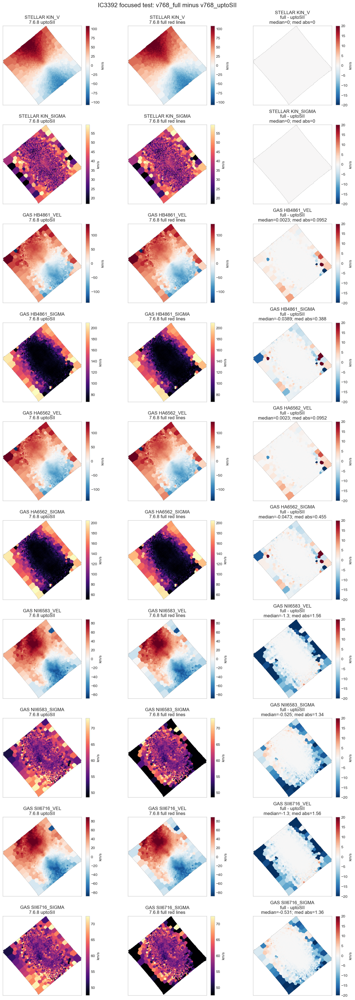

In [5]:
def make_main_kwargs(tracer_key, run_keys):
    spec = TRACERS[tracer_key]
    values = finite_values([maps[tracer_key][run_key] for run_key in run_keys])
    kwargs = {'origin': 'lower', 'cmap': spec['cmap']}
    if spec['center_main']:
        limit = robust_symmetric_limit(values, percentile=98, fallback=1.0)
        kwargs['norm'] = TwoSlopeNorm(vmin=-limit, vcenter=0.0, vmax=limit)
    else:
        vmin, vmax = robust_limits(values)
        kwargs['vmin'] = vmin
        kwargs['vmax'] = vmax
    return kwargs


def plot_focused_full_vs_uptoSII(tracer_keys=FOCUS_TRACERS, diff_limit=20.0):
    pair = PAIR_BY_KEY['extra_red_lines_effect']
    baseline = pair['baseline']
    compare = pair['compare']
    fig, axes = plt.subplots(
        len(tracer_keys),
        3,
        figsize=(13.5, 3.6 * len(tracer_keys)),
        squeeze=False,
        constrained_layout=True,
    )
    fig.suptitle('IC3392 focused test: v768_full minus v768_uptoSII', fontsize=16)

    for row, tracer_key in enumerate(tracer_keys):
        spec = TRACERS[tracer_key]
        main_kwargs = make_main_kwargs(tracer_key, [baseline, compare])
        diff = maps[tracer_key][compare] - maps[tracer_key][baseline]
        vals = diff[np.isfinite(diff)]
        median_delta = np.nanmedian(vals) if vals.size else np.nan
        med_abs = np.nanmedian(np.abs(vals)) if vals.size else np.nan
        if spec['unit'] == 'km/s':
            diff_norm = TwoSlopeNorm(vmin=-diff_limit, vcenter=0.0, vmax=diff_limit)
        else:
            diff_lim = robust_symmetric_limit(diff, percentile=98, fallback=0.01)
            diff_norm = TwoSlopeNorm(vmin=-diff_lim, vcenter=0.0, vmax=diff_lim)

        panels = [
            (RUNS[baseline]['plot_label'], maps[tracer_key][baseline], main_kwargs, spec['unit']),
            (RUNS[compare]['plot_label'], maps[tracer_key][compare], main_kwargs, spec['unit']),
            (f"full - uptoSII\nmedian={median_delta:.3g}; med abs={med_abs:.3g}", diff, {'origin': 'lower', 'cmap': 'RdBu_r', 'norm': diff_norm}, spec['unit']),
        ]
        for col, (title, arr, kwargs, unit) in enumerate(panels):
            ax = axes[row, col]
            im = ax.imshow(arr, **kwargs)
            ax.set_title(f'{spec["label"]}\n{title}')
            ax.set_xticks([])
            ax.set_yticks([])
            cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            if unit:
                cbar.set_label(unit)

    plt.show()


plot_focused_full_vs_uptoSII()


## Four-run map grids

These are the broader visual context, with four absolute maps followed by the most useful pairwise residual maps. The first residual column is always the focused full-minus-uptoSII test.

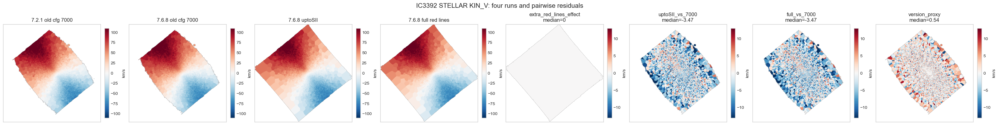

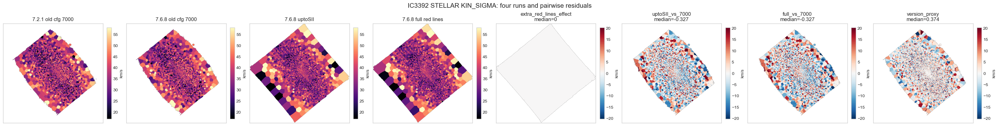

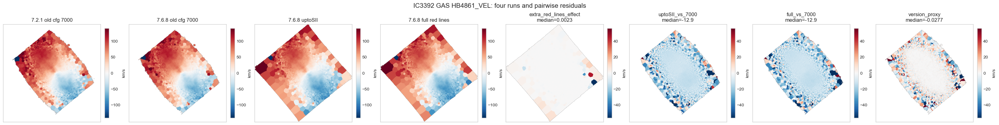

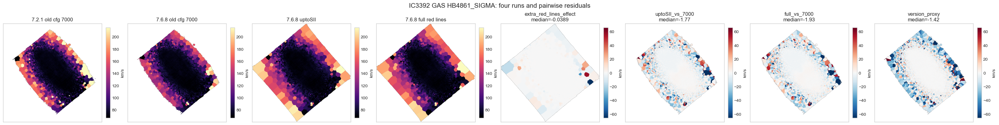

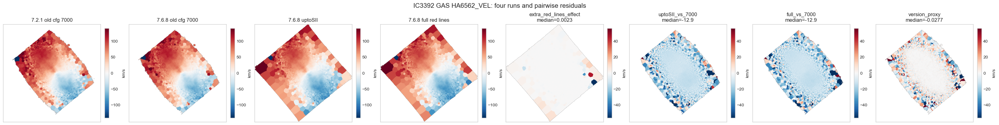

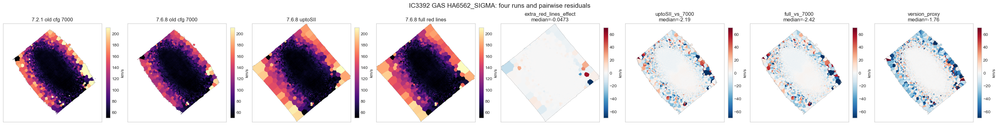

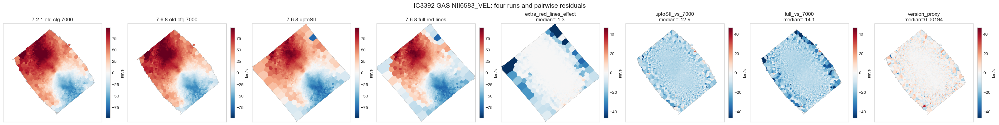

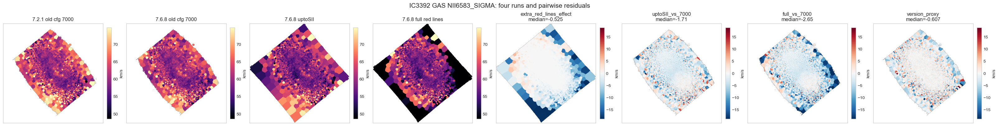

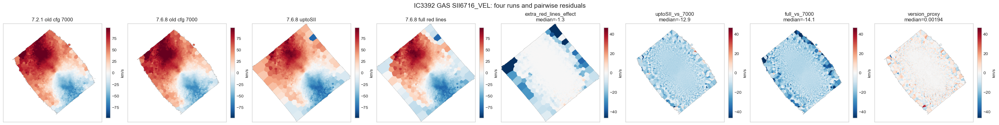

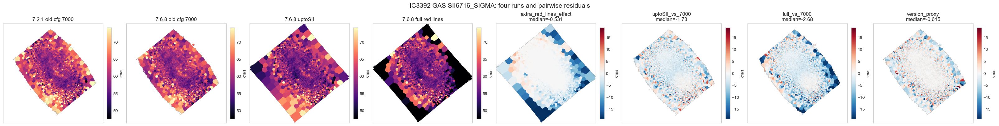

In [6]:
def plot_four_run_and_delta_grid(tracer_key, pair_keys=MAP_PAIR_KEYS):
    spec = TRACERS[tracer_key]
    main_kwargs = make_main_kwargs(tracer_key, RUN_ORDER)
    deltas = [maps[tracer_key][PAIR_BY_KEY[key]['compare']] - maps[tracer_key][PAIR_BY_KEY[key]['baseline']] for key in pair_keys]
    diff_lim = robust_symmetric_limit(finite_values(deltas), percentile=98, fallback=1.0)
    diff_norm = TwoSlopeNorm(vmin=-diff_lim, vcenter=0.0, vmax=diff_lim)

    ncols = len(RUN_ORDER) + len(pair_keys)
    fig, axes = plt.subplots(1, ncols, figsize=(4.0 * ncols, 4.2), constrained_layout=True)
    fig.suptitle(f'IC3392 {spec["label"]}: four runs and pairwise residuals', fontsize=15)

    for col, run_key in enumerate(RUN_ORDER):
        ax = axes[col]
        im = ax.imshow(maps[tracer_key][run_key], **main_kwargs)
        ax.set_title(RUNS[run_key]['plot_label'])
        ax.set_xticks([])
        ax.set_yticks([])
        cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        if spec['unit']:
            cbar.set_label(spec['unit'])

    for offset, pair_key in enumerate(pair_keys):
        pair = PAIR_BY_KEY[pair_key]
        residual = maps[tracer_key][pair['compare']] - maps[tracer_key][pair['baseline']]
        vals = residual[np.isfinite(residual)]
        median_delta = np.nanmedian(vals) if vals.size else np.nan
        ax = axes[len(RUN_ORDER) + offset]
        im = ax.imshow(residual, origin='lower', cmap='RdBu_r', norm=diff_norm)
        ax.set_title(f"{pair_key}\nmedian={median_delta:.3g}")
        ax.set_xticks([])
        ax.set_yticks([])
        cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        if spec['unit']:
            cbar.set_label(spec['unit'])

    plt.show()


for tracer_key in FOCUS_TRACERS:
    plot_four_run_and_delta_grid(tracer_key)


## Gas scatter and residual diagnostics

For each gas tracer, the first row is the focused `v768_full - v768_uptoSII` test. The following rows compare the uptoSII/full runs back to the older 7000-A setup.

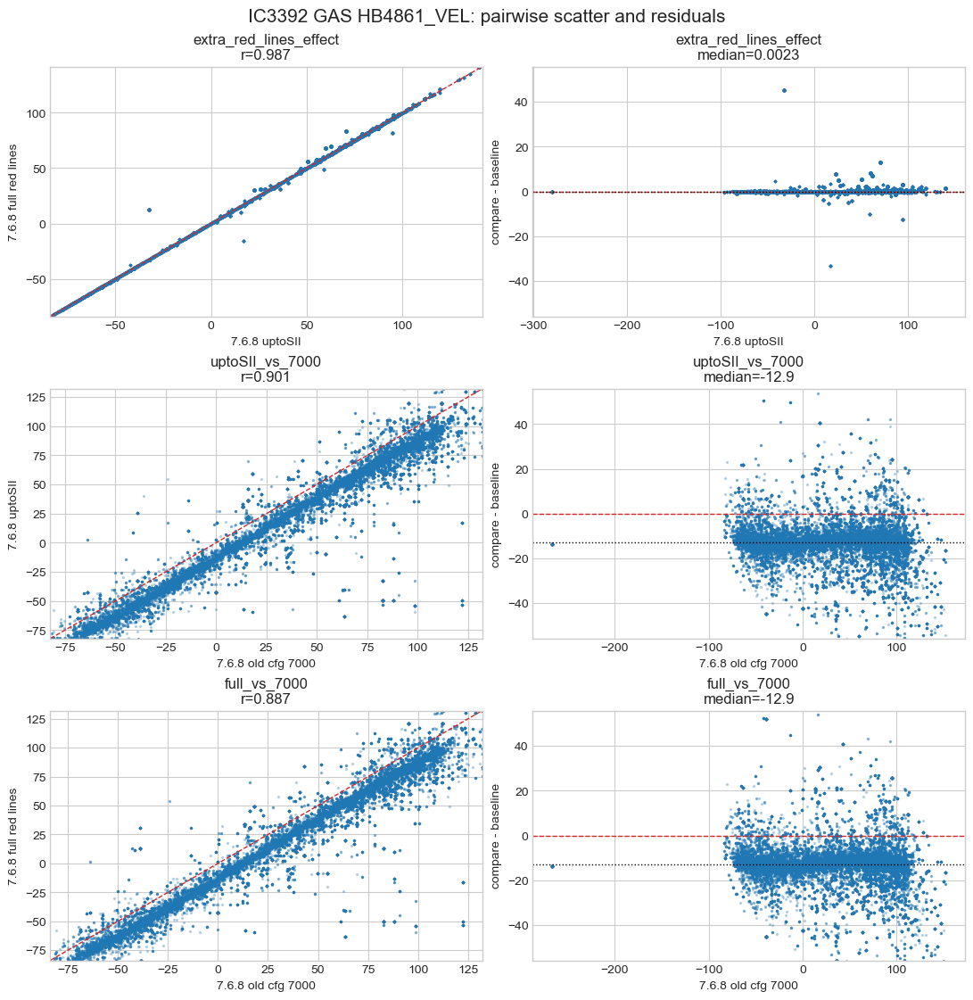

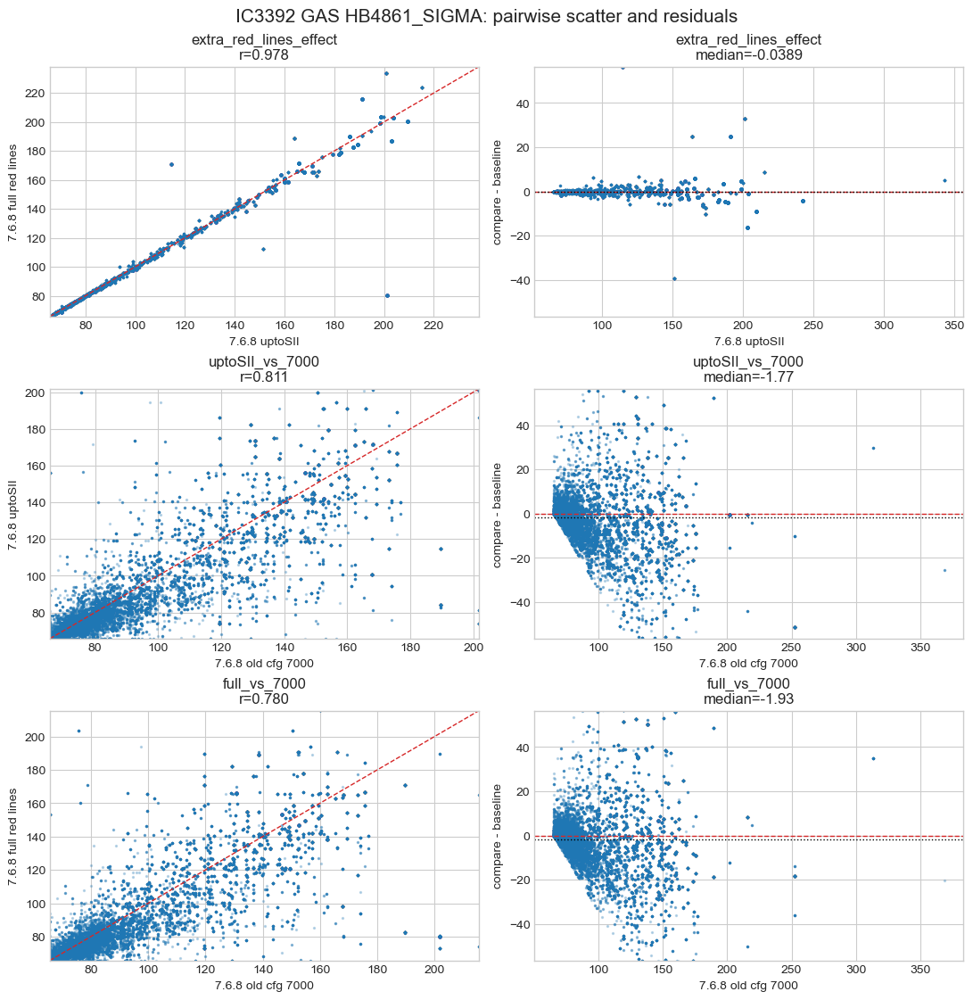

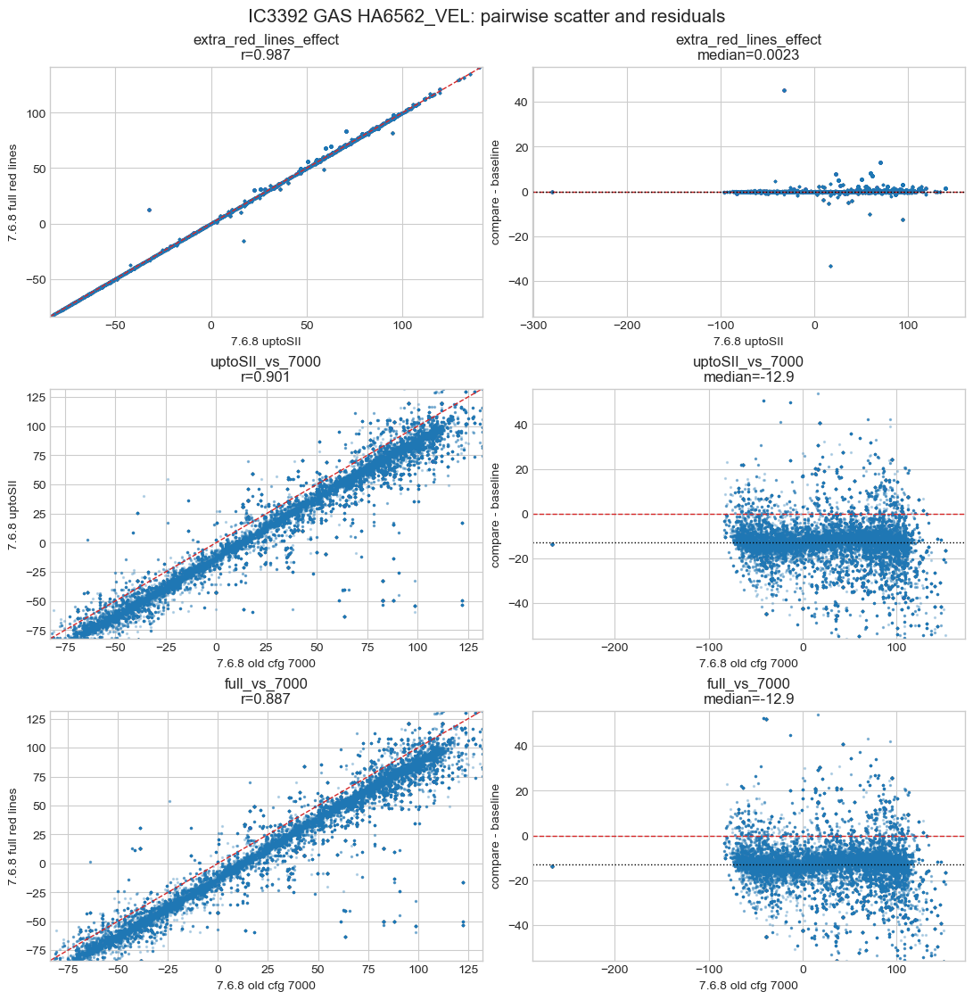

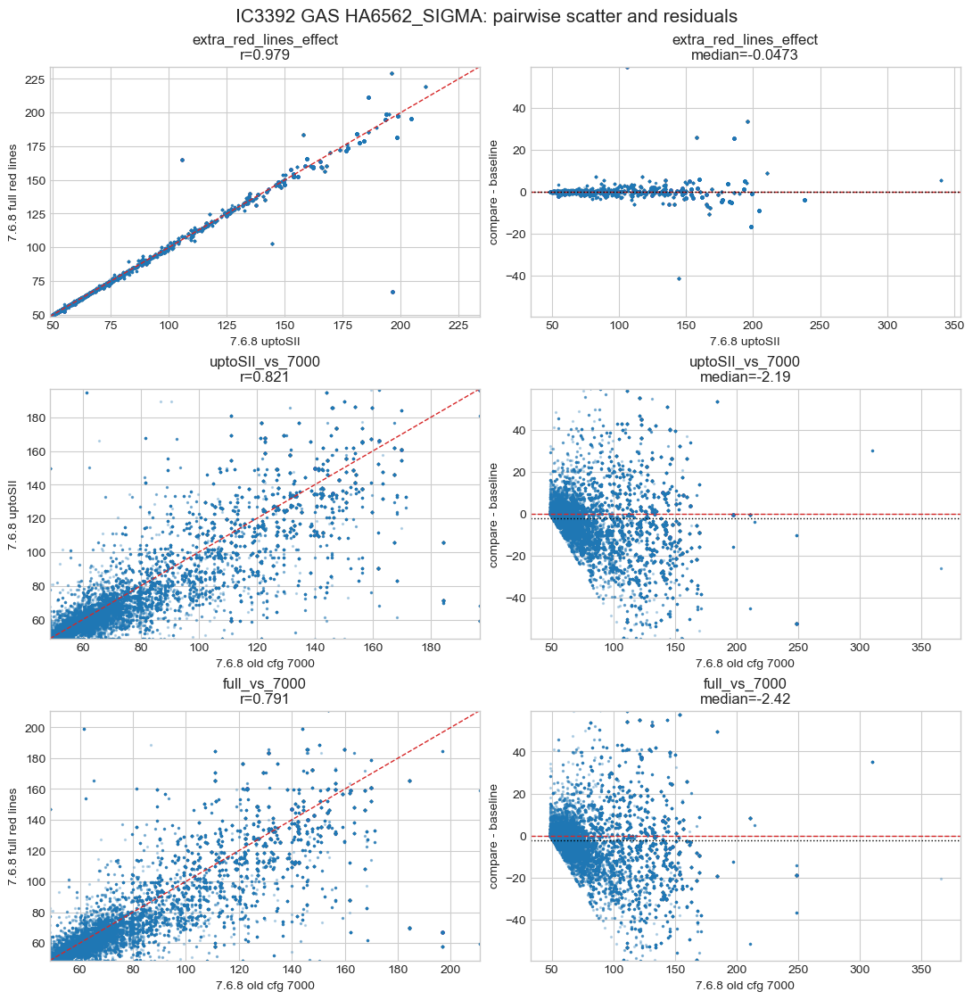

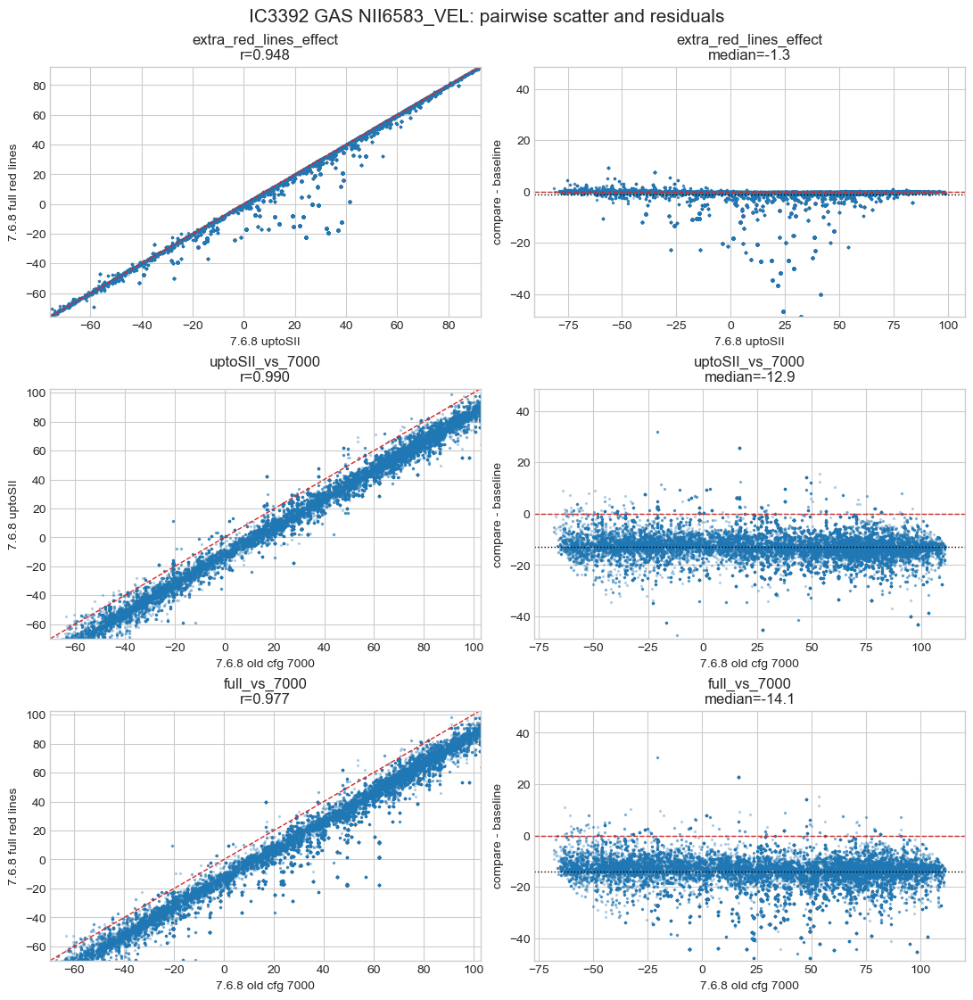

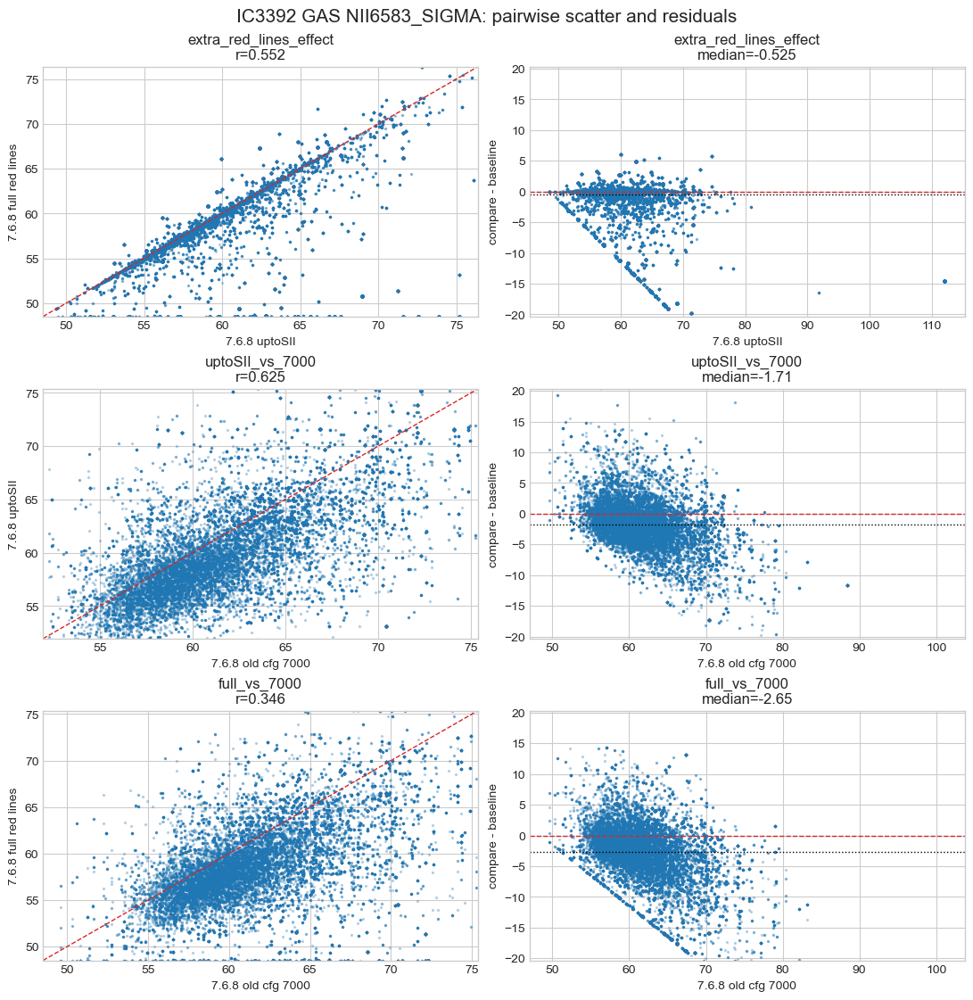

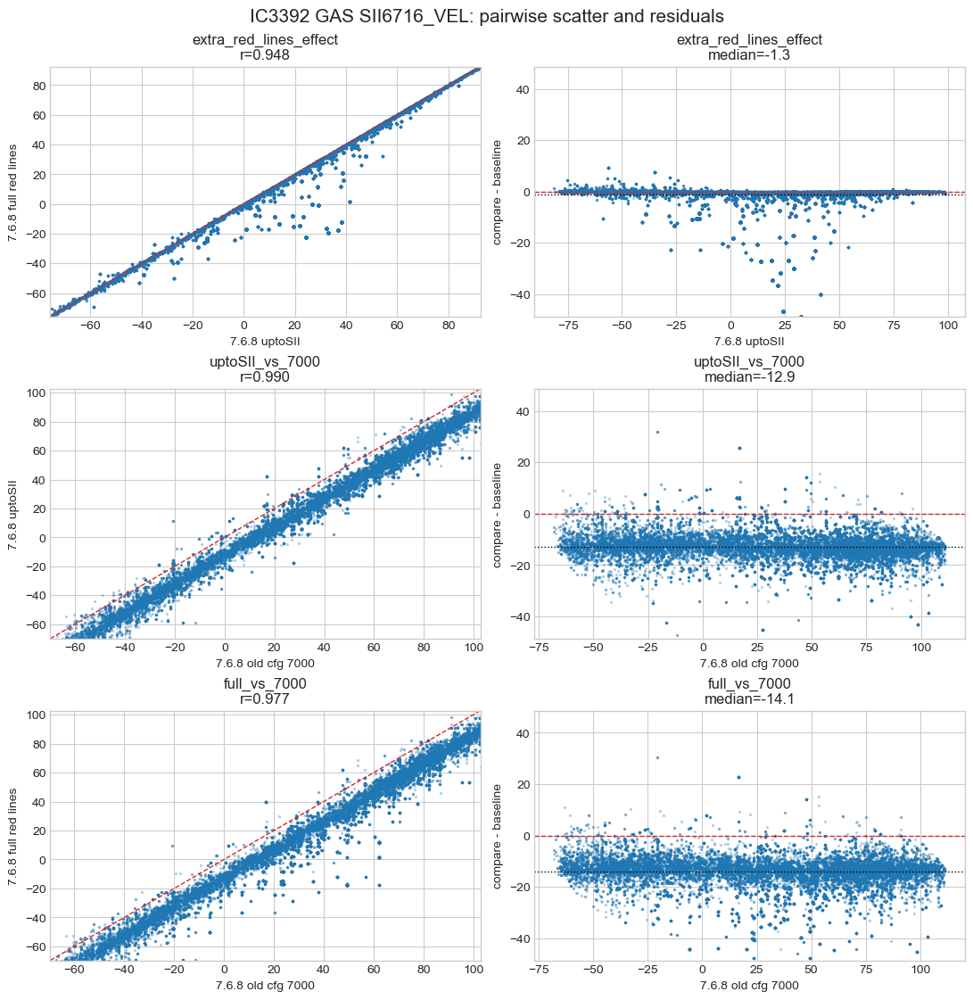

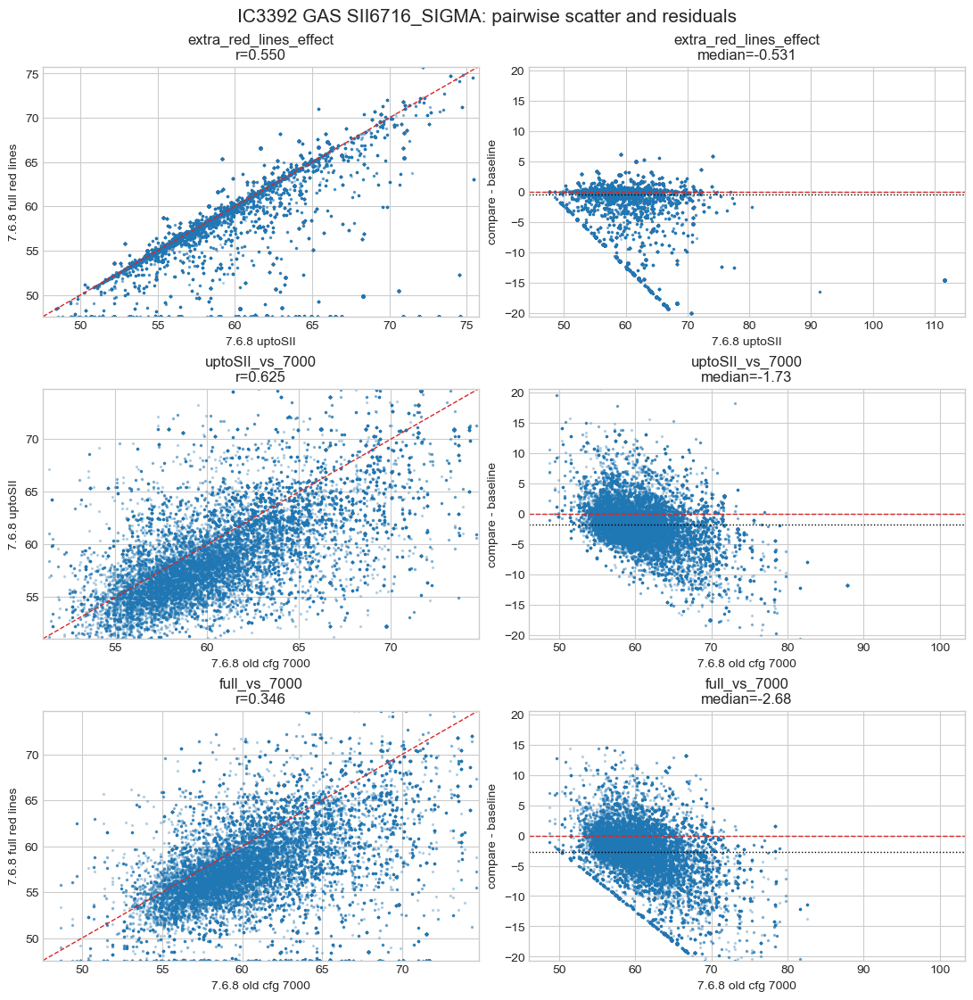

In [7]:
def plot_tracer_pair_scatter_residuals(tracer_key, pair_keys=('extra_red_lines_effect', 'uptoSII_vs_7000', 'full_vs_7000'), max_points=30000, random_state=7):
    spec = TRACERS[tracer_key]
    rng = np.random.default_rng(random_state)
    residuals = [maps[tracer_key][PAIR_BY_KEY[key]['compare']] - maps[tracer_key][PAIR_BY_KEY[key]['baseline']] for key in pair_keys]
    dlim = robust_symmetric_limit(finite_values(residuals), percentile=98, fallback=1.0)

    fig, axes = plt.subplots(
        len(pair_keys),
        2,
        figsize=(10.8, 3.7 * len(pair_keys)),
        squeeze=False,
        constrained_layout=True,
    )
    fig.suptitle(f'IC3392 {spec["label"]}: pairwise scatter and residuals', fontsize=15)

    for row, pair_key in enumerate(pair_keys):
        pair = PAIR_BY_KEY[pair_key]
        baseline = maps[tracer_key][pair['baseline']]
        compare = maps[tracer_key][pair['compare']]
        mask = np.isfinite(baseline) & np.isfinite(compare)
        baseline_vals = baseline[mask]
        compare_vals = compare[mask]
        delta = compare_vals - baseline_vals

        scatter_ax = axes[row, 0]
        residual_ax = axes[row, 1]

        if baseline_vals.size == 0:
            scatter_ax.set_title(f'{pair_key}: no valid overlap')
            residual_ax.set_title(f'{pair_key}: no valid overlap')
            continue

        if baseline_vals.size > max_points:
            idx = rng.choice(baseline_vals.size, size=max_points, replace=False)
            plot_baseline = baseline_vals[idx]
            plot_compare = compare_vals[idx]
            plot_delta = delta[idx]
        else:
            plot_baseline = baseline_vals
            plot_compare = compare_vals
            plot_delta = delta

        lim_lo, lim_hi = robust_limits(np.r_[baseline_vals, compare_vals], p=(1, 99))
        median_delta = np.nanmedian(delta)
        pearson_r = np.corrcoef(baseline_vals, compare_vals)[0, 1] if baseline_vals.size > 1 and np.nanstd(baseline_vals) > 0 and np.nanstd(compare_vals) > 0 else np.nan

        scatter_ax.scatter(plot_baseline, plot_compare, s=2, alpha=0.25)
        scatter_ax.plot([lim_lo, lim_hi], [lim_lo, lim_hi], color='tab:red', linestyle='--', linewidth=1)
        scatter_ax.set_xlim(lim_lo, lim_hi)
        scatter_ax.set_ylim(lim_lo, lim_hi)
        scatter_ax.set_xlabel(RUNS[pair['baseline']]['plot_label'])
        scatter_ax.set_ylabel(RUNS[pair['compare']]['plot_label'])
        scatter_ax.set_title(f'{pair_key}\nr={pearson_r:.3f}')

        residual_ax.scatter(plot_baseline, plot_delta, s=2, alpha=0.25)
        residual_ax.axhline(0.0, color='tab:red', linestyle='--', linewidth=1)
        residual_ax.axhline(median_delta, color='black', linestyle=':', linewidth=1)
        residual_ax.set_ylim(-dlim, dlim)
        residual_ax.set_xlabel(RUNS[pair['baseline']]['plot_label'])
        residual_ax.set_ylabel('compare - baseline')
        residual_ax.set_title(f'{pair_key}\nmedian={median_delta:.3g}')

    plt.show()


for tracer_key in GAS_FOCUS_TRACERS:
    plot_tracer_pair_scatter_residuals(tracer_key)


## Focused interpretation helper

This compact table ranks whether the full red-line GAS file changes each tracer. It is intentionally simple: the maps and scatter plots above are the final diagnostic.

In [8]:
def classify_extra_red_lines_row(row):
    if row['n_valid'] == 0:
        return 'no overlap'
    if row['kind'] == 'stellar' and row['median_abs_delta'] == 0 and row['rms_delta'] == 0:
        return 'unchanged as expected'
    if row['kind'] == 'stellar':
        return 'stellar changed; unexpected for this focused pair'
    if row['family'] == 'VEL':
        if row['median_abs_delta'] < 1 and row['rms_delta'] < 5:
            return 'gas velocity mostly stable'
        if row['median_abs_delta'] < 3:
            return 'gas velocity changed locally / asymmetric'
        return 'gas velocity changed clearly'
    if row['family'] == 'SIGMA':
        if row['median_abs_delta'] < 1 and row['rms_delta'] < 5:
            return 'gas sigma mostly stable'
        if row['median_abs_delta'] < 3:
            return 'gas sigma changed locally / asymmetric'
        return 'gas sigma changed clearly'
    return 'inspect visually'

focused_interpretation = focused_extra_red_lines.copy()
focused_interpretation['focused_read'] = focused_interpretation.apply(classify_extra_red_lines_row, axis=1)
focused_interpretation = focused_interpretation[
    [
        'tracer', 'kind', 'family', 'focused_read', 'pearson_r',
        'median_delta_compare_vs_baseline', 'median_abs_delta', 'p16_delta', 'p84_delta', 'rms_delta'
    ]
]
display(focused_interpretation)

print('Focused test summary: v768_full - v768_uptoSII')
for _, row in focused_interpretation.iterrows():
    print(
        f"  {row['tracer']}: {row['focused_read']}; "
        f"median={row['median_delta_compare_vs_baseline']:.3g}, "
        f"median_abs={row['median_abs_delta']:.3g}, rms={row['rms_delta']:.3g}"
    )


,tracer,kind,family,focused_read,pearson_r,median_delta_compare_vs_baseline,median_abs_delta,p16_delta,p84_delta,rms_delta
0,KIN_V,stellar,VEL,unchanged as expected,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,KIN_SIGMA,stellar,SIGMA,unchanged as expected,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,KIN_H3,stellar,moment,unchanged as expected,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,KIN_H4,stellar,moment,unchanged as expected,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,GAS_HB4861_VEL,gas,VEL,gas velocity changed locally / asymmetric,0.987222,0.002304,0.095167,-0.120501,1.531310,9.541494
5,GAS_HB4861_SIGMA,gas,SIGMA,gas sigma changed locally / asymmetric,0.978101,-0.038934,0.388088,-1.608539,0.684313,9.999040
6,GAS_HA6562_VEL,gas,VEL,gas velocity changed locally / asymmetric,0.987222,0.002304,0.095167,-0.120501,1.531310,9.541494
7,GAS_HA6562_SIGMA,gas,SIGMA,gas sigma changed locally / asymmetric,0.979048,-0.047262,0.454636,-1.724280,0.751164,10.599982
8,GAS_NII6583_VEL,gas,VEL,gas velocity changed locally / asymmetric,0.947763,-1.298147,1.559003,-17.795999,0.001975,15.502743
9,GAS_NII6583_SIGMA,gas,SIGMA,gas sigma changed locally / asymmetric,0.551992,-0.525105,1.340583,-11.772361,0.251288,7.854154


Focused test summary: v768_full - v768_uptoSII
  KIN_V: unchanged as expected; median=0, median_abs=0, rms=0
  KIN_SIGMA: unchanged as expected; median=0, median_abs=0, rms=0
  KIN_H3: unchanged as expected; median=0, median_abs=0, rms=0
  KIN_H4: unchanged as expected; median=0, median_abs=0, rms=0
  GAS_HB4861_VEL: gas velocity changed locally / asymmetric; median=0.0023, median_abs=0.0952, rms=9.54
  GAS_HB4861_SIGMA: gas sigma changed locally / asymmetric; median=-0.0389, median_abs=0.388, rms=10
  GAS_HA6562_VEL: gas velocity changed locally / asymmetric; median=0.0023, median_abs=0.0952, rms=9.54
  GAS_HA6562_SIGMA: gas sigma changed locally / asymmetric; median=-0.0473, median_abs=0.455, rms=10.6
  GAS_NII6583_VEL: gas velocity changed locally / asymmetric; median=-1.3, median_abs=1.56, rms=15.5
  GAS_NII6583_SIGMA: gas sigma changed locally / asymmetric; median=-0.525, median_abs=1.34, rms=7.85
  GAS_SII6716_VEL: gas velocity changed locally / asymmetric; median=-1.3, median_ab

## Optional save

Uncomment these lines if you want CSV summaries for notes or a report.

In [9]:
# summary.to_csv('IC3392_KIN_GAS_4runs_pairwise_summary_stats.csv', index=False)
# focused_extra_red_lines.to_csv('IC3392_KIN_GAS_4runs_extra_red_lines_focus.csv', index=False)
# focused_interpretation.to_csv('IC3392_KIN_GAS_4runs_extra_red_lines_interpretation.csv', index=False)
# config_deltas.to_csv('IC3392_KIN_GAS_4runs_config_deltas.csv', index=False)
# print('Saved IC3392 four-run comparison CSV files.')
